# Kynning
Fyrr í þessu námskeiði kynntumst við tímaraðagreiningu þar sem við hönnun m.a. líkön sem lýsa tímahegðun mismunandi kerfa. Stundum er sniðugt að skipta alfarið um sjónarhorn. Í stað þess að skoða tímaþróun talnarununnar okkar á raunásnum brjótum við hana upp í sínusbylgjur og kryfjum hegðunina á tíðniásnum. Þetta er kölluð tíðnigreining (e. frequency domain analysis) eða rófgreining (e. spectral analysis). Við ætlum skoða slíkar aðferðir í þessari vinnubók.


*Stærðfræðigreining III* kynnir til sögunnar Laplace ummyndanir og ræðir tengsl þeirra við lausn á ýmsum diffurjöfnum. [Stærðfræðigreining IV](https://edbook.hi.is/stae401g/kafli04/#) birtist okkur á fjórða misseri en þar kynnumst við meðal annars hugmyndum um Fourier raðir og földun. Við fáum líka örstutta kynningu á Fourier röðum í *Stærðfræði fyrir eðlisfræðinga I*.

Kaflar 7 og 8 í Boas fjalla talsvert um Fourier- og Laplace-ummyndanir (t.d. í Kafla 7.12, bls. 378). Þar sjáum við meðal annars að Laplace- og Fourier-ummyndanir er hægt að nota til þess að leysa ýmsar tegundir af diffurjöfnum. Næstu tvær vikur ætlum við hins vegar að tengja þessi umfjöllunarefni við tölulega útreikninga og tímaraðagreiningu.

Við munum meðal annars:
*   Fræðast um strjálar Fourier-ummyndanir (e. Discrete Fourier Transform)
*   Skoða hraðar Fourier ummyndanir (e. fast Fourier transform)
*   Kynnast grunnhugmyndum um földun (e. convolution)
*   Tengja saman Fourier ummyndanir og földun


# Lesefni

Eins og í vikunum á undan byggjum við þessa vinnubók mikið á fyrirlestrarglósum um tímaraðagreiningu eftir F.M. Bianchi sem má finna [hér](https://filippomb.github.io/python-time-series-handbook/notebooks/00/intro.html). Umfjöllun þessarar viku byggir mikið á umfjöllun í [þessum kafla](https://filippomb.github.io/python-time-series-handbook/notebooks/08/signal-transforms-filters.html). Það tekur tíma að stilla efninu almennilega upp á íslensku og því hvet ég ykkur líka til að kíkja á upprunalega textann á ensku. Þar má jafnframt finna talsvert af aukaefni.

# Skemmtilegir tenglar

*   https://www.jezzamon.com/fourier/
*   https://thepythoncodingbook.com/2021/08/30/2d-fourier-transform-in-python-and-fourier-synthesis-of-images/



# Upphitun

Grundvallarhugmyndin í Fourier greiningu segir að hvert fall, eða í okkar tilfelli tímaröð, megi lýsa með línulegri samantekt sínusfalla með mismunandi lotu (eða tíðni). Skoðum dæmi:

$$
y(t) = A\sin(2\pi f t + \psi)  = A\sin (\omega t + \psi)
$$

Jafnan hér fyrir ofan lýsir lotubundnu falli með tíðnina $f$ og því lotuna $T = 1/f$. Stærðin $A$ er útslag þessa falls en $\psi$ er kallaður fasi bylgjunnar. Venjulega segjum við að $\psi \in [0, 2\pi [$.

 Takið eftir því að sínusfallið er samfellt og skilgreint fyrir öll gildi $x \in \mathcal{R}$.

 Við skulum leika okkur aðeins með fasa sínusbylgjunnar í kóðanum hér fyrir neðan.

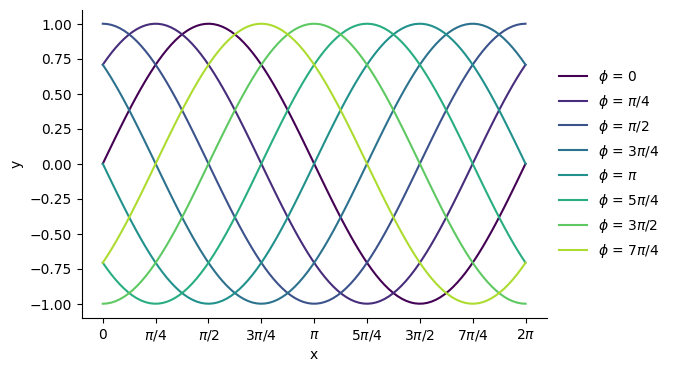

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.cm as cm

x = np.linspace(0, 2*np.pi, 100)
phase = np.pi/4.0 * np.arange(8) # Fasinn

labels = ['0', '$\\pi/4$', '$\\pi/2$', '$3\\pi/4$', '$\\pi$', \
                    '$5\\pi/4$', '$3\\pi/2$', '$7\\pi/4$', '$2\\pi$' ]

# Búum til lista með litum úr litasafni sem okkur finnst flott
colormap = plt.get_cmap('viridis')
colors = [colormap(i/len(phase)) for i in range(len(phase))]

fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(6, 4))

# Innbygðu Python föllin enumerate og zip eru mjög gagnleg með for lykkjum
for i, (label, phasei) in enumerate(zip(labels, phase)):
  ax.plot(x, np.sin(x + phasei), label='$\\phi$ = {:s}'.format(label),
          color=colors[i])

ax.set_xlabel('x')
ax.set_ylabel('y')
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), frameon=False)
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.set_xticks(np.pi/4.0 * np.arange(9))
ax.set_xticklabels(labels)
ax.set_xlabel('x')
ax.set_ylabel('y')
plt.show()

Fasinn hliðrar sem sagt sínusfallinu eftir $x$-ásnum.

# Fourier-greining í hnotskurn

Þegar við vinnum með Fourier-greiningu á einhvers konar tímaröð þá erum við eiginlegar að brjóta tímaröðina upp í summur af sínusföllum með mismunandi tíðnir, útslag og fasa. Eftirfarandi mynd er afar lýsandi:

![Fourier transforms.](https://filippomb.github.io/python-time-series-handbook/_images/ft.png)


Af myndinni hér að ofan má sjá að fall sem sem er samsuða tveggja sínusbylgna. Þegar við skoðum tíðniróf fallsins sjáum við að þessu falli er líst með tveimur einföldum toppum (eins konar Dirac delta föllum) sem tákna tíðnir þessara sínusbylgna.

Fjölmörg verkefni í rafsegulfræði nota Fourier-ummyndun til þess að brjóta merki upp í tíðniþætti. Þetta getur verið afar gagnlegt þar sem rafsegulbylgjur (ljós) sem við mælum og sjáum eru ekki alltaf bara með eina fasta tíðni.


# Fourier-ummyndanir
Við tókum einn fyrirlestur í Stærðfræði fyrir eðlisfræðinga I (Stæ211G) til þess að fjalla um kósínus- og sínus-ummyndanir á lotubundnum föllum. En hvað gerist ef að föllin eru ekki endilega lotubundin? Það ætti kannski ekki að koma á óvart að því tilfelli er summum skipt út fyrir heildun.


# Fourier-raðir og Fourier-ummyndanir

Við kynntumst Fourier-röðum fyrir lotubundin föll í Stæ211 og að sjálfsögðu í Stærðfræðigreiningu IV.

Hvað gerist ef að við erum að vinna með fall sem að er ekki endilega lotubundið og skilgreint fyrir allar rauntölur $x \in \mathcal{R}$? Boas fjallar um þetta í Kafla 7.12.

Fourier-röð á tvinntalnaformi má rita sem:

\begin{align}
f(x) &=  \sum _{-\infty} ^{\infty} c_n e^{i n \pi x / l}, \\
c_n &=  \frac{1}{2l} \int _{-l}^l f(x) e^{-i n \pi x / l} dx.
\end{align}


Þegar við í staðinn viljum skoða samfellt tíðniróf þá breytast jöfnurnar örlítið:

\begin{align}
f(x) &=  \int _{-\infty} ^{\infty} F(\omega) e^{i \omega x} d\omega, \\
F(\omega) &=  \frac{1}{2\pi} \int _{-\infty}^\infty f(x) e^{-i \omega x } dx.
\end{align}

Athugið að þegar við erum að vinna með tímaröð þá skiptum við oft breytunni $x$ út fyrir $t$. Þá fæst einfaldlega:

\begin{align}
f(t) &=  \int _{-\infty} ^{\infty} F(\omega) e^{i \omega t} d\omega, \\
F(\omega) &=  \frac{1}{2\pi} \int _{-\infty}^\infty f(t) e^{-i \omega t } dt.
\end{align}

**ATH1:** Skilgreiningin á Fourier-ummyndun er ekki stöðluð. Sumar kennslubækur setja þáttinn $1/\sqrt{2\pi}$ fyrir framan bæði heildunarmerkin.

**ATH2:** Það er oft sagt að fallið $f(x)$ tákni *raunás* (e. real domain) eða *tímaás* (e. time domain) og $F(\omega)$ tákni *tíðniás* (e. frequency domain, e. Fourier space) en af hverju er það?

# Nokkrir punktar um Fourier-ummyndanir
Hér er hægt að staldra við og nefna nokkur mikilvæg atriði:
*   $t$ táknar tíma
*   $f(t)$ er samfelld tímaröð
*   $F(\omega)$ er Fourier ummyndun fallsins $f(t)$
*   $\omega = 2\pi f$ er horntíðnin
*   $i$ er tvinntala

Jafnframt sjáum við að:
*   Þátturinn $e^{i\omega t} = \cos(\omega t) + i \sin (\omega t)$ er tvinntala
*   Við getum hugsað um $e^{i\omega t}$ sem vigur í tvinntalnasléttunni sem snýst með horntíðnni $\omega$
*   Það að við heildum frá $-\infty$ til $\infty$ táknar að þurfum að skoða hegðun fallsins $f(t)$ yfir allan tíma til þess að skilja tíðnieiginleika fallsins
*   Fourier ummyndun fallsins $f(t)$ er tvinntölufall sem er skilgreint fyrir allar tíðnir (bæði jákvæðar og neikvæðar)
*   Þessi ummyndun segir hversu stóran rullu hver tíðni leikur við myndun hinnar upprunalegu tímaraðar
*   Tölugildir fallsins $F (\omega)$ segir til um styrk tíðninnar $\omega$ við myndun tímaraðarinnar
*   Þegar Fourier ummyndun er reiknuð þá margföldum við fallið $f(t)$ með þættinu $e^{i\omega t}$. Þegar þessir tveir þættir eru heildaðir yfir allan rauntalnaásinn, þ.e.a.s. frá $t = -\infty$ til $t=\infty$ þá detta út allir þættir tímaraðarinnar sem sveiflast ekki með tíðninni $\omega$



# Annar ritháttur
Það er mjög algengt að sjá $k$ notað í stað $\omega$. Við getum allt eins ritað:
\begin{align}
f(x) &= \int _{-\infty}^\infty F(k) e^{i k x} dk \\
F(k) &= \frac{1}{2\pi}\int _{-\infty}^\infty f(x) e^{-i k x} dx
\end{align}

Munið að eðlisfræðingar skilgreina bylgjuvigur (e. wave vector) sem $k = 2\pi / \lambda$ þar sem $\lambda$ táknar öldulengd ljóss. Ef við munum svo að hraða ljóss í tómarúmi er $c = \nu \lambda$ sést að $\nu = c / \lambda$ þar sem $c$ er einfaldlega einhver fasti. Við sjáum sem sagt að $k$ er í réttu hlutfalli við tíðni.

# Strjál Fourier ummyndun
Strjál Fourier-ummyndun (e. Discrete Fourier Transform, DFT) fyrir talnarunu, $x_n$, af lengd $N$ er skilgreind sem:
\begin{equation}
X_k = \sum_{n=0}^{N-1} x_n e^{-i \frac{2\pi}{N} kn},
\end{equation}
fyrir $k = 0, 1, \dots, N-1$, þar sem Fourier-ummynduðu gildin $X_k$ tákna stök á tíðniás.

Takið eftir því að ummyndunin byggir á því að sækja gildi af einingarhringnum í tvinntalnasléttunni.



Þessi strjála Fourier-ummyndin varpar semsagt tvinntalnarunu $x_0, x_1, ..., x_{n-1}$ yfir í aðra tvinntalnarunu $X_0, X_1, ..., X_{n-1}$ með jöfnunni fyrir ofan. Það getur verið gagnlegt að prófa sig áfram með þessa vörpun og reikna strjála Fourier-ummyndun fyrir einfaldar runur.

## Dæmi
Reiknið strjála Fourier-ummyndun fyrir rununa $x_0, x_1, x_2, x_3$ sem hægt er að tákna með vigrinum
$$\mathbf{x} = \begin{pmatrix}1 + 2i\\3-i\\7i\\5\end{pmatrix}$$
Þau sem nenna ekki að stinga þessum stökum inn í jöfnuna fyrir ofan geta hoppað yfir í næstu sellu.

In [ ]:
import numpy as np
x = np.array([1 + 2j, 3 - 1j, 7j, 5])
X = np.fft.fft(x)
print(X)

[ 9. +8.j  0. -3.j -7.+10.j  2. -7.j]


Takið eftir því að við settum inn vigur af stærðinni 4 x 1 og fengum út vigur af stærðinni 4 x 1. Þetta er í samræmi við skilgreininguna á strjálri Fourier-ummyndun hér fyrir ofan. En hvað í ósköpunum er þessi ummyndun eiginlega að kenna okkur?

## Strjál Fourier-ummyndun sem fylkjamargfeldi
En hvað í ósköpunum táknar þessi fjögurra staka vigur? Ef við grannskoðum jöfnuna fyrir ofan þá má sjá að þessi strjála Fourier-ummyndun má skrifa sem fylkamargfeldi.
$$
\mathbf{X}
=
\begin{bmatrix}
X_0 \\
X_1 \\
\vdots \\
X_{N-1}
\end{bmatrix}
=
\underbrace{
\begin{bmatrix}
1 & 1 & 1 & \cdots & 1 \\
1 & e^{-i 2\pi \frac{1}{N}} & e^{-i 2\pi \frac{2}{N}} & \cdots & e^{-i 2\pi \frac{(N-1)}{N}} \\
1 & e^{-i 2\pi \frac{2}{N}} & e^{-i 2\pi \frac{2\cdot 2}{N}} & \cdots & e^{-i 2\pi \frac{2 (N-1)}{N}} \\
\vdots & \vdots & \vdots & \ddots & \vdots \\
1 & e^{-i 2\pi \frac{(N-1)}{N}} & e^{-i 2\pi \frac{2 (N-1)}{N}} & \cdots & e^{-i 2\pi \frac{(N-1)(N-1)}{N}}
\end{bmatrix}
}_{\displaystyle \mathbf{F}_N}
\begin{bmatrix}
x_0 \\
x_1 \\
\vdots \\
x_{N-1}
\end{bmatrix},
$$

$$
(\mathbf{F}_N)_{k,n} = e^{-i 2\pi k n / N}, \qquad k,n = 0,1,\dots,N-1.
$$

Fylkið $\mathbf{F}_N$, sem hefur stærðina $N \times N$, táknar þá einhhvers konar línuleg aðgerð sem verkar á talnarunu á rauntalnaásnum og varpar henni yfir á tíðniásinn.


## Umritun

Ef við skilgreinum $\omega _N = e^{-i 2\pi / N}$, þá má umrita jöfnuna fyrir ofan sem:
$$
\begin{align}
\mathbf{X}
=
\begin{bmatrix}
X_0 \\
X_1 \\
\vdots \\
X_{N-1}
\end{bmatrix}
&=
\begin{bmatrix}
\omega_N^{0 \cdot 0} & \omega_N^{0 \cdot 1} & \cdots & \omega_N^{0 \cdot (N-1)} \\
\omega_N^{1 \cdot 0} & \omega_N^{1 \cdot 1} & \cdots & \omega_N^{1 \cdot (N-1)} \\
\vdots & \vdots & \ddots & \vdots \\
\omega_N^{(N-1)\cdot 0} & \omega_N^{(N-1)\cdot 1} & \cdots & \omega_N^{(N-1)\cdot (N-1)}
\end{bmatrix}
\begin{bmatrix}
x_0 \\
x_1 \\
\vdots \\
x_{N-1}
\end{bmatrix} \\
&=
\begin{bmatrix}
1 & 1 & \cdots & 1 \\
1 & \omega_N^{1 \cdot 1} & \cdots & \omega_N^{1 \cdot (N-1)} \\
\vdots & \vdots & \ddots & \vdots \\
1 & \omega_N^{(N-1)\cdot 1} & \cdots & \omega_N^{(N-1)\cdot (N-1)}
\end{bmatrix}
\begin{bmatrix}
x_0 \\
x_1 \\
\vdots \\
x_{N-1}
\end{bmatrix} \\
\end{align}
$$

Takið sérstaklega eftir fyrstu röðinni í þessari vörpun. Þegar $k = 0$ þá er $e^{-i 2\pi k n / N} = 0$. Fyrsta stakið í $X_k$ vigrinum, þ.e.a.s. $X_0$, táknar þá bara summu allra stakana í $x_n$ rununni.

Hvað með annað stakið? Hvað gerist þegar við marföldum tvinntölu með tölunum $e^{-i 2\pi \frac{1}{N}}$, $e^{-i 2\pi \frac{2}{N}}$, o.s.frv? Hér er líklega best að skoða mynd.


<div>
<center>
<img src="https://cmbeam.com/uploads/teaching/dft_hringur.png" width="600"/>
</center>
</div>






Margföldun á tvinntölu $z$ með tvinntölunni $e^{-i 2\pi \frac{1}{N}}$ jafngildir því að snúa $z$ um einingarhringinn sem nemur $1/N$ hluta af hringnum.

Myndin hér fyrir ofan sýnir vonandi að þegar við margföldum runu af lengd $N$ með talnaruninni $e^{-i 2\pi \frac{1}{N}}, e^{-i 2\pi \frac{2}{N}}, \ldots$ pikkum við upp merki sem að sveiflast einu sinni fyrir hver $N$ skref. Næsta stak í strjálu Fourier-ummynduninn sækir sveiflur sem verða tvisvar sinn á $N$ skrefa fresti, o.s.frv. Sem sagt, hvert stak $X_k$, í ummynduninni lýsir þeim hluta tímaraðarinnar sem sveiflast með tíðnina $k2\pi$.

In [ ]:
# https://numpy.org/doc/2.3/reference/generated/numpy.fft.fftfreq.html
for n in [4, 5, 8, 16, 31, 32]:
  print(np.fft.fftfreq(n))

[ 0.    0.25 -0.5  -0.25]
[ 0.   0.2  0.4 -0.4 -0.2]
[ 0.     0.125  0.25   0.375 -0.5   -0.375 -0.25  -0.125]
[ 0.      0.0625  0.125   0.1875  0.25    0.3125  0.375   0.4375 -0.5
 -0.4375 -0.375  -0.3125 -0.25   -0.1875 -0.125  -0.0625]
[ 0.          0.03225806  0.06451613  0.09677419  0.12903226  0.16129032
  0.19354839  0.22580645  0.25806452  0.29032258  0.32258065  0.35483871
  0.38709677  0.41935484  0.4516129   0.48387097 -0.48387097 -0.4516129
 -0.41935484 -0.38709677 -0.35483871 -0.32258065 -0.29032258 -0.25806452
 -0.22580645 -0.19354839 -0.16129032 -0.12903226 -0.09677419 -0.06451613
 -0.03225806]
[ 0.       0.03125  0.0625   0.09375  0.125    0.15625  0.1875   0.21875
  0.25     0.28125  0.3125   0.34375  0.375    0.40625  0.4375   0.46875
 -0.5     -0.46875 -0.4375  -0.40625 -0.375   -0.34375 -0.3125  -0.28125
 -0.25    -0.21875 -0.1875  -0.15625 -0.125   -0.09375 -0.0625  -0.03125]



Við tökum eftir því að stökin í þessum runum virðast ca. spanna bilið $[-0.5, 0.5]$ Hvað tákna þessar tölur?

## Fjöldi stika
Áður en lengra er haldið er gagnglegt að kíkja á blokkina fyrir neðan. Hér erum við að skoða sínusbylgju með tíðnina 1 yfir bilið $t \in [0, 5]$. Við notum tímaraðir með mismunandi fjölda staka til þess að tákna þessa sínusbylgju. Við sjáum ansi fljótt að það þarf ákveðinn fjölda staka til þess að sínusbylgjan teiknist almennilega upp. Tíðnin og því lota þessarar bylgju er 1 og þar sem við teiknum fallið upp yfir bilið frá 0 til 5 þá erum við með u.þ.b. 3, 6, 13 og 26 stök per lotu í gluggunum hér fyrir neðan. Það er eiginilega ekki fyrr en við erum komin með ca 10 stök per lotu sem við sjáum að hér eru um sínusbylgju að ræða.

Hvað segir þetta okkur um eiginleika tímaraða til þess að skorða hátíðnisveiflur?

Þau sem hafa áhuga geta prófa að lesa um hugtakið Nyquist sampling:
https://en.wikipedia.org/wiki/Nyquist%E2%80%93Shannon_sampling_theorem

16 stök
32 stök
64 stök
128 stök


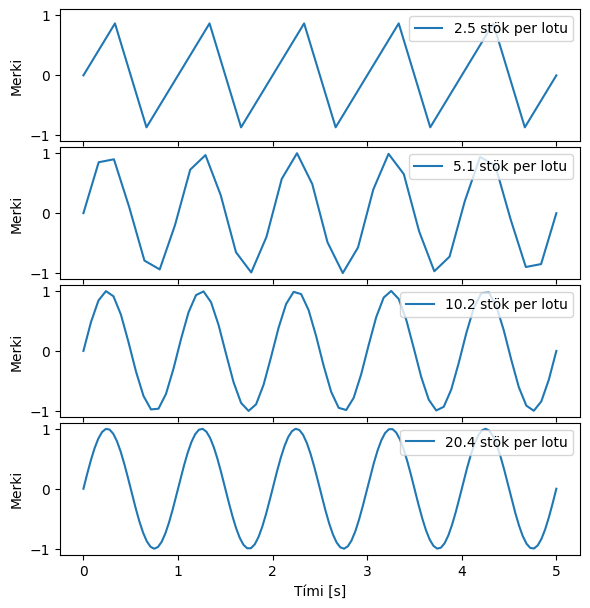

In [ ]:
import matplotlib.pyplot as plt
freq = 1
fig, axs = plt.subplots(4, 1, figsize=(6, 6))
for idx, npow in enumerate([4, 5, 6, 7]):
    time = np.linspace(0, 5, 2**npow)
    y_sine = np.sin(2 * np.pi * freq * time)
    print('{:d} stök'.format(2**npow))
    axs[idx].plot(time, y_sine, label='{:.1f} stök per lotu'.format(2**npow/2/np.pi))
    axs[idx].set_ylim(-1.1, 1.1)
    axs[idx].legend(loc=1)
    if idx < 3:
        axs[idx].xaxis.set_ticklabels([])
    axs[idx].set_ylabel('Merki')

plt.tight_layout(h_pad=0)
plt.xlabel('Tími [s]')
plt.show()


Takið eftir því að öllum fjórum römmunum hér fyrir ofan þá erum við að reyna að teikna upp graf af sama sínusfallinu.

# Hraðar Fourier-ummyndanir
Samkvæmt skilgreiningu á strjálri Fourier-ummyndun (e. discrete Fourier transform) þá sést að til þess að reikna slíka ummyndun fyrir vigur að lengd $N$ þarf $N^2$ reikninga; fylkið $\mathbf{F}_N$, sem hefur stærðina $N \times N$.

Hraða Fourier-ummyndunin (Fast Fourier Transform, FFT) nýtir sér samhverfu- og lotueiginleika veldisvísisfallanna. Hún brýtur DFT verkefni niður í smærri og smærri verkefni og dregur þannig úr fjölda útreikninga. Þetta reiknirit (e. algorithm) er kennt við Cooley og Tukey sem þróuðu það á sjöunda áratug síðustu aldar.

## Nlog(N)

Í stað þess að þurfa $N^2$ reikninga til þess að framkvæma þessa Fourier-ummyndun er verkefnið að stærðinni $N \log (N)$. Athugið að þegar $N$ er stór tala þá verður munurinn á $N^2$ og $N\log(N)$ gífurlegur.

Dæmi:

*   $N = 10$: $N^2 = 100$, $N\log (N) = 10$
*   $N = 100$: $N^2 = 10.000$, $N\log (N) = 100$
*   $N = 1000$: $N^2 = 1.000.000$, $N\log (N) = 3000$



## FFT í samfélaginu
Hraðar Fourier-ummyndanir eru satt að segja notaðar í flestum nútíma raftækjum; þær eru satt að segja ein af grunnstoðum stafrænna hagkerfa. Þessi aðgerð er sérstaklega mikilvæg í fjarskiptum þar sem hún gerir gagnaflutning um ljósleiðara, farsímanet og Wi-Fi möguleg. Við notum þessa tækni m.a. í læknisfræði bæði í myndgreiningu og í greiningu hjartalínurita. Síðast en ekki síst þá notum við hraðar Fourier-ummyndanir til þess að vinna með og þjappa gögnum í hljóðskrám. Tæknin gerir okkur kleift að greina mynstur og truflanir í gagnasöfnum sem væru annars falin.

Dæmi:
*   Þjöppun á tónlistarupptökum
*   Þjöppun á hvers konar myndefni (sbr. JPEG og MPEG-4)
*   Talgreinar (e. speech recognition)
*   Greining á mynstrum á fjármálamörkuðum
*   Þráðlaus netkerfi
*   Dulkóðun merkja

**ATH:** Hraðar Fourier ummyndanir (e. FFT) eru ekki kynntar í Boas.

Ég mæli með því að þið horfið á frábært kennsluefni um Fourier ummyndanir á 3Blue1Brown YouTube síðunni ef að þið hafið ekki séð það áður: https://www.youtube.com/watch?v=spUNpyF58BY

## FFT í Numpy

Í reikningunum hér á eftir notum við þrjú föll úr `Numpy`.
- **`fft(y)`**: Reiknar hraða Fourier-ummyndun af einhverri tímaröð, $y[n]$.

- **`fftfreq(n, d)`**: Skilar tíðnibilum Fourier-ummyndunar;  
  - `n` er fjöldi staka í tímaröðinni
  - `d` er tímabilið milli gilda í tímaröð, $d = \Delta t = t_{i+1} - t_i$ þar sem $t_{i+1}$ og $t_{i}$ er tímagildi samliggjandi
mælinga í tímaröð

- **`fftshift(x)`**: Færir núll-tíðniþáttinn yfir á miðju tíðnisviðsins:  
  `[ 0.,  1.,  2., ..., -3., -2., -1.] → [-5., -4., -3., -2., -1.,  0.,  1.,  2.,  3.,  4.]`

Takið smá tíma til að kynna ykkur virkni þessara falla.

**ATH:** Við gerum alltaf ráð fyrir að tíðni mælinga sé fasti í þessari umfjöllun

## FFT hjálparfall

Við skilgreinum hjálparfall hér fyrir neðan en það framkvæmir Fourier-greiningu á tímaröð og teiknar upp gagnleg gröf:

In [ ]:
import scipy.signal as signal

# Fall sem teiknar gröf sem sýna raunrúm og tíðnirúm tímaraðar
def plot_time_freq(t, y):
    # Reiknum strjála Fourier-ummyndun og tölugildi þeirrar ummyndunar
    freq = np.fft.fftfreq(t.size, d=t[1]-t[0])
    Y = abs(np.fft.fft(y))
    #Y = np.angle(np.fft.fft(y))

    # Graf fyrir raunásinn
    plt.figure(figsize = [14,3])
    plt.subplot(1,2,1)
    plt.plot(t,y)
    plt.title('Raunás (e. real domain)')
    plt.xlabel('Tími')
    plt.ylabel('Merki')

    # Graf fyrir tíðniásinn
    plt.subplot(1,2,2)
    markerline, stemline, baseline = plt.stem(np.fft.fftshift(freq),np.fft.fftshift(Y),
                                              'k', markerfmt='tab:orange')
    plt.setp(stemline, linewidth = 1.5)
    plt.setp(markerline, markersize = 4)
    plt.title('Tíðniás (e. frequency domain)')
    plt.xlabel('Tíðni')
    plt.xlim(-20, 20)
    plt.ylabel('Tölugildi FFT')
    plt.grid()

    plt.tight_layout()
    plt.show()

    return freq, Y

## Dæmi um Fourier-ummyndanir
Í undirköflunum hér fyrir neðan tökum við dæmi um nokkrar tímaraðir og Fourier-ummyndanir þeirra

### Fourier-ummyndun sínusbylgju
Sjáum hvað gerist þegar við skilgreinum einfalda sínusbylgju og hendum henni inn fallið `plot_time_freq`:

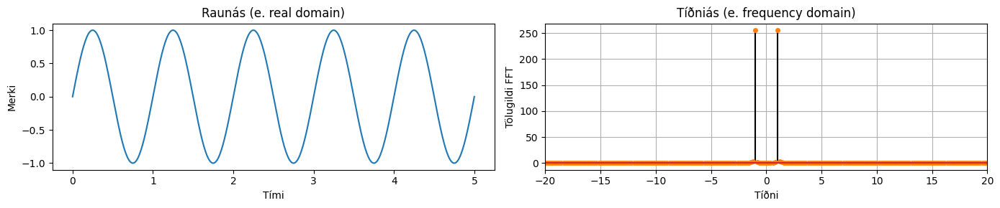

In [ ]:
freq = 1
time = np.linspace(0, 5, 512)
y_sine = np.sin(2 * np.pi * freq * time)
_, _ = plot_time_freq(time, y_sine)

Hér sjáum við að Fourier-ummyndun einfaldrar sínusbylgja hefur fasta tíðni.

Takið eftir að þetta gefur til kynna að Fourier-ummyndun sínusfalls eru tvö Dirac-delta föll!

### Fourier-ummyndun sínusbylgju með hærri tíðni

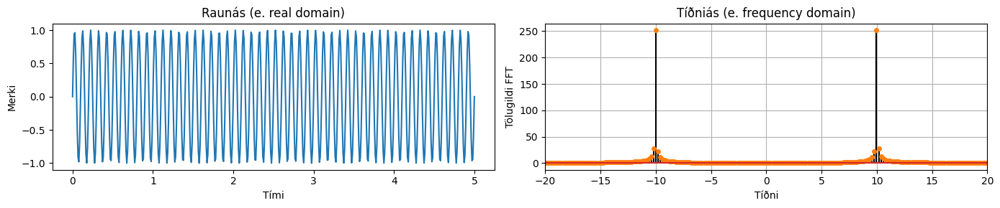

In [ ]:
freq = 10
y_sine = np.sin(2 * np.pi * freq * time)
plot_time_freq(time, y_sine);

### Dirac delta fall
Við skilgreinum Dirac delta „fallið“ með
$$
\delta =
\begin{cases}
 0 & \text{ef } x \neq 0, \\
 1 & \text{ef } x = 0
\end{cases}
$$
og skilyrðunum:
$$
\int_{-\infty}^{\infty} \delta(x)\,dx = 1.
$$
Látum $f(x)$ vera samfellt fall í $x=0$. Þá gildir:

$$
\int_{-\infty}^{\infty} f(x)\delta(x)\,dx = f(0).
$$

Ef $f(x)$ er samfelld í $x = x_0$, þá gildir einnig:
$$
\int_{-\infty}^{\infty} f(x)\delta(x - x_0)\,dx = f(x_0).
$$
Með þessum skilgreiningum er hægt að reina Fourier-ummyndun Dirac delta fallsins:
$$
F(k) = \mathcal{F}(\delta(x))
= \frac{1}{2\pi}\int_{-\infty}^{\infty} \delta(x)e^{ik x}\,dx
= \frac{1}{2\pi}.
$$


Við sjáum sem sagt að Fourier-ummyndun Dirac delta fallsins er fasti. Skoðum grafið hér fyrir neðan.

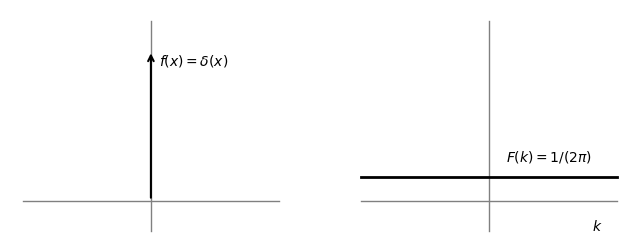

In [ ]:
x = np.linspace(0 , 2 * np.pi, 1001)
fig, axes = plt.subplots(1, 2, figsize=(8, 3))

xw = 1.5
yamp = 1.2
ylow = 0.2
famp = 1/np.pi/2.

ax0, ax1 = axes[0], axes[1]
ax0.plot([-xw, xw], [0, 0], color='gray', lw=1)
ax0.plot([0, 0], [-ylow, yamp], color='gray', lw=1)
ax1.plot([-xw, xw], [0, 0], color='gray', lw=1)
ax1.plot([0, 0], [-ylow, yamp], color='gray', lw=1)
ax1.plot([-xw, xw], [famp, famp], color='black', lw=2)

ax0.annotate('', xy=(0, 1), xytext=(0, 0), arrowprops=dict(arrowstyle='->', linewidth=1.5))
ax1.annotate('$k$', (yamp, -0.2))

ax0.text(0.1, 0.9, r'$f(x)=\delta(x)$')
ax1.text(0.2, famp + 0.1, r'$F(k)= 1/(2\pi)$')

# Felum ása grafsins
for ax in axes:
  ax.set_axis_off()

plt.show()

Hvað er eiginlega að gerast nálægt toppunum tveimur á tíðniásnum? Af hverju eru þeir breiðari en áður?

### Fourier-ummyndun fasta

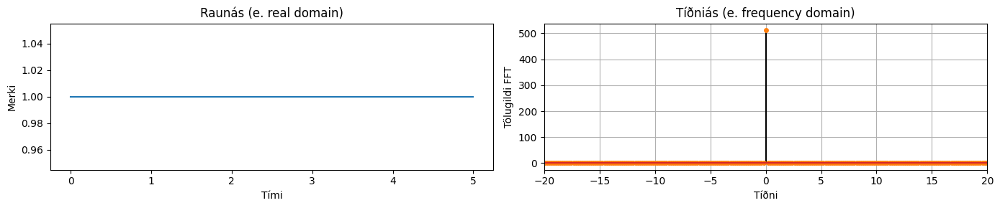

In [ ]:
# Data set in Time Domain
y_constant = np.ones(time.shape)

plot_time_freq(time, y_constant);

### Fourier-ummyndun Dirac delta falls

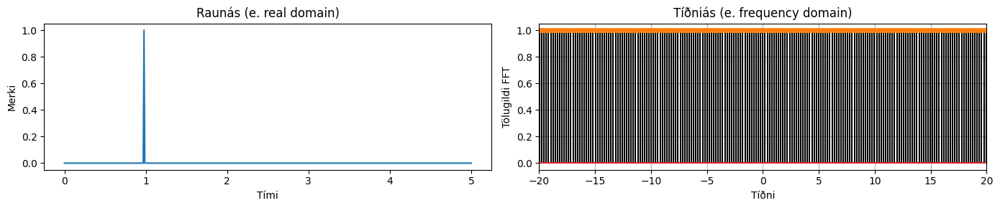

In [ ]:
y_delta = np.zeros(time.shape)
y_delta[100] = 1

plot_time_freq(time, y_delta);

### Fourier-ummyndun þrepfalls (e. step function)

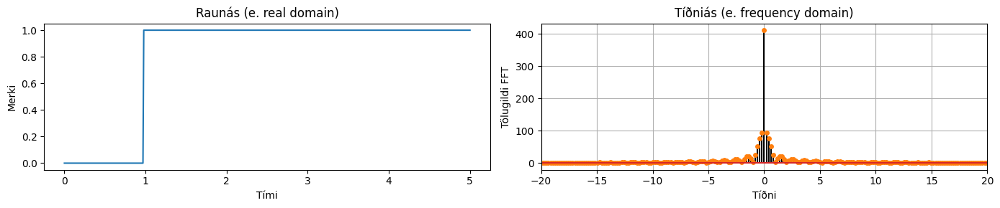

In [ ]:
y_step = np.zeros(time.shape)
y_step[100:] = 1

plot_time_freq(time, y_step);

### Fourier-ummyndun sinc falls

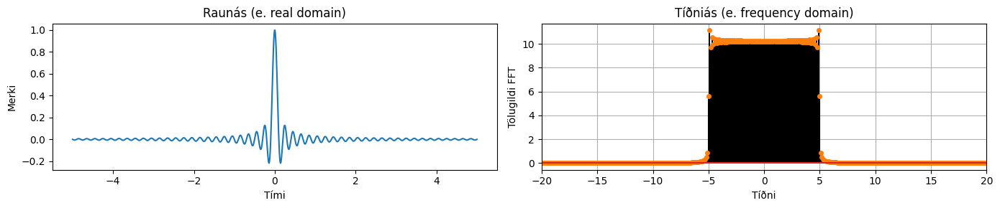

In [ ]:
time = np.linspace(-5, 5, 1024)
freq=5
y_sinc = np.sin(2 * np.pi * freq * time) / (2 * np.pi * freq * time)
plot_time_freq(time, y_sinc);

### Fourier-ummyndun tímaraðar brotin upp
Eins og við sáum í umfjöllun um tímaraðir þá er oft hægt að brjóta tímaröð upp í þrjá þætti:

1.   Einhvers konar reglulegar (oft árstíðabundnar) sveiflur
2.   Leitni (e. trend)
3.   Suð (e. noise)

Í hólfunum hér fyrir neðan sjáum við þessa þætti og samsvarandi Fourier-ummyndun. Prófið að breyta hegðun þessara falla eftir raunásnum og sjá hvernig Fourier-ummyndanirnar breytast.


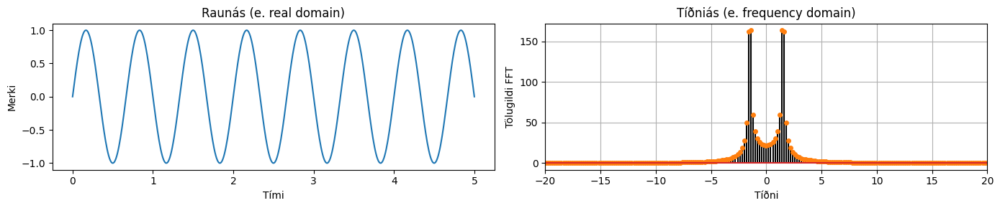

In [ ]:
time = np.linspace(0, 5, 512)
freq = 1.5

y_sine = np.sin(2 * np.pi * freq * time)
plot_time_freq(time, y_sine);

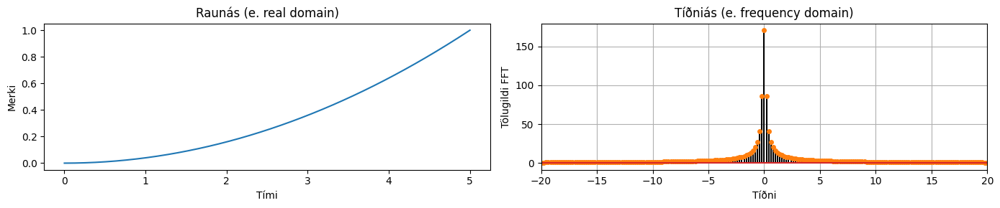

In [ ]:
y_trend = (0.2 * time)**2
plot_time_freq(time, y_trend);

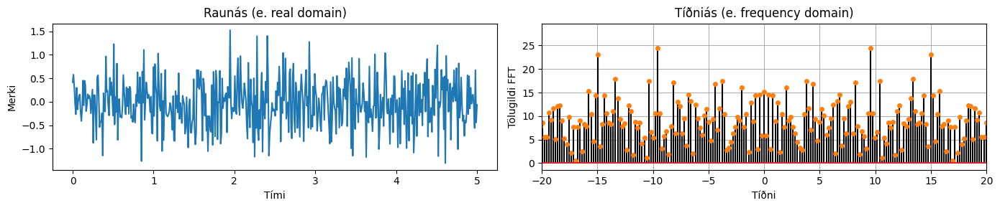

In [ ]:
y_noise = 0.5 * np.random.randn(len(time))
plot_time_freq(time, y_noise);

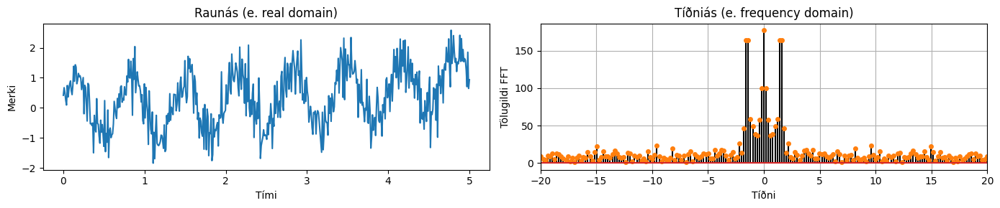

In [ ]:
# Leggjum saman þessa þrjá þætti tímaraðarinnar til þess að fá eftirfarandi
noisy_signal = y_sine + y_trend + y_noise
plot_time_freq(time, noisy_signal);

Takið eftir því að

*   Sveiflan framkallar toppa á tíðniás nálægt tíðninni 1.5
*   Leitnin verður að lágtíðnitoppum
*   Suðið er jafndreift yfir alla tíðnir

Af hverju er topparnir í kringum ±1.5 á tíðniásnum fyrir Fourier-ummyndun sveiflnanna svona breiðir? Við reynum að svara því í næsta hluta.


## Tíðniupplausn og FFT

Í dæminu fyrir neðan skoðum við hraðar Fourier-ummyndanir af tímaröðum sem sýna sínusbylgju með tíðnina $\nu = 1$ á bilinu $t \in [0, 5]$. Tímaraðirnar hafa lengdina 16, 64 og 256. Það er mjög lærdómsríkt að skoða hvað gerist þegar við aukum fjölda mælipunkta í tímaröðinni okkar.

Len = 16
Min = -1.5
Max = 1.3125
Len = 64
Min = -6.300000000000001
Max = 6.103125
Len = 256
Min = -25.5
Max = 25.30078125


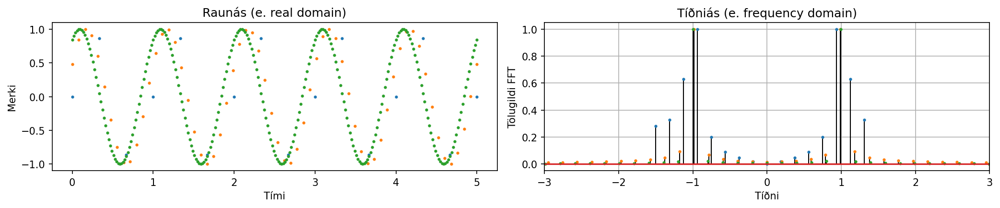

In [ ]:

def plot_time_freq_multi(t, y, idx=0, axs=None, normalize=True):

    # Reiknum strjála Fourier-ummyndun og tölugildi þeirrar ummyndunar
    freq = np.fft.fftfreq(t.size, d=t[1]-t[0])
    Y_FFT = abs(np.fft.fft(y))
    Y_FFT = np.fft.fftshift(Y_FFT)

    if normalize:
      Y_FFT /= np.max(Y_FFT)

    freq_shift = np.fft.fftshift(freq)

    print('Len = {}'.format(len(freq_shift)))
    print('Min = {}'.format(np.min(freq_shift)))
    print('Max = {}'.format(np.max(freq_shift)))

    if idx == 0:
        fig, axs = plt.subplots(1, 2, figsize=(14, 3))

    p = axs[0].plot(t, y, lw=0, marker='.', markersize=4)
    axs[0].set_title('Raunás (e. real domain)')
    axs[0].set_xlabel('Tími')
    axs[0].set_ylabel('Merki')

    markerline, stemline, baseline = axs[1].stem(freq_shift, Y_FFT,
                                              'k', markerfmt='{:s}'.format(p[0].get_color()))

    plt.setp(stemline, linewidth = 1)
    plt.setp(markerline, markersize = 2)

    return freq, Y_FFT, axs

axs = None
freq = 1

for idx, npow in enumerate([4, 6, 8]):
    time = np.linspace(0, 5, 2**npow)
    y_sine = np.sin(2 * np.pi * freq * time + idx/2)
    _, _, axs = plot_time_freq_multi(time, y_sine, idx=idx, axs=axs);

plt.title('Tíðniás (e. frequency domain)')
plt.xlabel('Tíðni')
plt.xlim(-3, 3)
plt.ylabel('Tölugildi FFT')
plt.grid()
plt.tight_layout()
plt.show()

## Tíðnileki (e. spectral leakage)

Tíðniupplausn er skilgreind sem: (`Mælitíðni`)/(`Fjöldi mælipunkta`).




In [ ]:
Fs = 1234     # Mælitíðni tímaraðar mæld í Hz
duration = 4  # Lengd mælinga í sekúndum
t = np.arange(0, duration, 1/Fs)  # Tímavigur
print(f"Tíðniupplausn: {Fs/len(t):.2f}")

Tíðniupplausn: 0.25


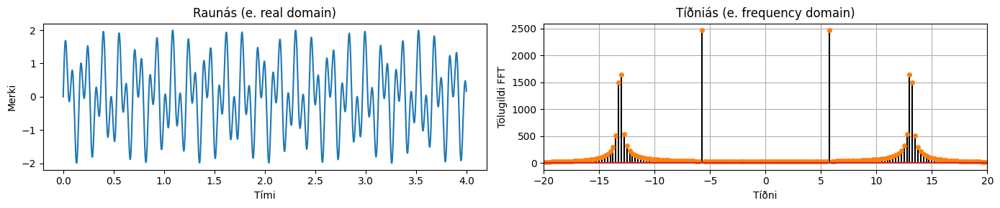

In [ ]:
freq1 = 5.75   # Tíðni 1. sínusbylgju mæld í Hz
freq2 = 13.12  # Tíðni 2. sínusbylgju mæld í Hz

y_sine = np.sin(2 * np.pi * freq1 * t) + np.sin(2 * np.pi * freq2 * t)
plot_time_freq(t, y_sine);

Við getum borið útreiknaða tíðniupplausn saman við það sem kemur út úr `fftfreq` og `fftshift`.

In [ ]:
# Reiknum tíðnivigur fyrir tímaröðina
freq = np.fft.fftfreq(t.size, d=t[1]-t[0])
# Hliðrum tíðnivigrinum eins og við gerum þegar við teiknum gröfin að ofan
freq_shift = np.fft.fftshift(freq)
# Prentum tíðnivigurinn á skjáinn
print(freq_shift)

[-617.   -616.75 -616.5  ...  616.25  616.5   616.75]


Takið eftir því að bilið á milli tíðnistaka er 0.25.

Nú er gagnlegt að staldra aðeins við og skoða skilgreininguna á strjálli Fourier-ummyndun. Hugsum um tímaröð sem inniheldur sínusbylgju með ákveðna tíðni. Hvað gerist ef að lengd tímaraðarinnar inniheldur ekki heiltölufjölda af lotum? Fourier-ummyndun þessarar sínusbylgju dreifist þá á nokkur tíðnigildi.

Þetta fyrirbæri er kallað tíðnileki eða spectral leakage.

## Farþegafjöldi og hraðar Fourier ummyndanir
Við skulum kíkja aftur á gervitímaröðina fyrir Farþegafjölda í Leifstöð sem við bjuggum til í síðustu viku.

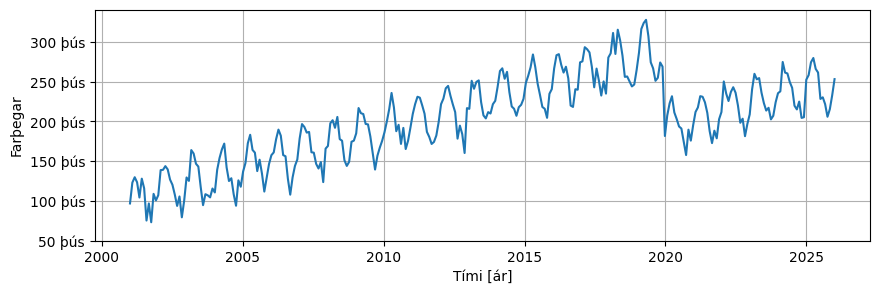

In [ ]:
# Setjum upp líkan sem býr til þykkjustugögn af fjöld farþega sem fara
# í gegnum Leifstöð á mánuði yfir 25 ára tímabil. Bætum svo við árstíðabundnum
# sveiflum, leitni, suði, og skyndilegum breytingum.
np.random.seed(6)

year0 = 2001
nyears = 25
steps_per_year = 12
nsteps = steps_per_year * nyears
year = np.linspace(year0, year0 + nyears, nsteps)
A = 3e4
k = 1e5
N = 1e4
slope = 1e4
covid = 1e5
passenger_trend = k + slope * (year-year0)
noise = N * np.random.randn(nsteps)
fluctuations = A * np.sin(2*np.pi*year)
passengers = passenger_trend + fluctuations + noise

# Bætum við skyndilegri lækkun í tímaröðinni
covid_effect = -covid * np.ones(nsteps)
idx = np.argmin(np.abs(year - 2020))
covid_effect[:idx] = 0
passengers_wcovid = passengers + covid_effect

# Teiknum upp graf
figsize=(10, 3)
fig, ax = plt.subplots(1, 1, figsize=figsize)
plt.plot(year, passengers_wcovid)
ax.set_xlabel("Tími [ár]")
ax.set_ylabel("Farþegar")
y1 = [5e4, 1.0e5, 1.5e5, 2.0e5, 2.5e5, 3e5]
y1_label = ['50 þús', '100 þús', '150 þús', '200 þús', '250 þús', '300 þús']
ax.set_yticks(y1)
ax.set_yticklabels(y1_label)
plt.grid()
plt.show()

Segjum nú að Isavia láti ykkur fá þessi gögn og biðji ykkur um að bera kennsl á styrkleika og tíðni tímabundinna sveiflna. Hvernig farið þið að því?

Í svona tilfellum væri mjög sniðugt að nota hraða Fourier ummyndun til að greina styrkleika sveiflna sem fall af tíðni.

Við skulum búa til fall sem tekur á móti einhvers konar tímaröð og kallar á mikilvæg FFT föll í `Numpy` til að framkvæma þessa greiningu (sjá næsta hluta).

Hér er MJÖG gagnlegt að staldra aðeins við og lesa sér til um það hvað `np.fft.fft` og `np.fft.fftfreq` gera.

https://numpy.org/doc/stable/reference/routines.fft.html

ATH: Það er ekki einfalt að tileinka sér þessi hugtök. Þið eruð ekki ein ef að ykkur finnst þetta flókið!

In [ ]:
def fft_analysis(signal):

    # Fjarlægjum almenna leitni gagnanna (e. detrending)
    slope, intercept = np.polyfit(np.arange(len(signal)), signal, 1)
    trend = np.arange(len(signal)) * slope + intercept
    detrended = signal - trend

    # Hér hefðum við líka geta notað
    # https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.detrend.html

    # Reiknum hraða Fourier ummyndun (FFT)
    fft_values = np.fft.fft(detrended)
    frequencies = np.fft.fftfreq(len(fft_values))

    # Fjarlægjum neikvæðar tíðnir
    positive_frequencies = frequencies[frequencies > 0]
    magnitudes = np.abs(fft_values)[frequencies > 0]

    # Finnum hágildi í Fourier ummynduninni
    dominant_frequency = positive_frequencies[np.argmax(magnitudes)]
    print(f"Dominant Frequency: {dominant_frequency:.3f}")

    # Finnum lotuna sem samsvarar þeirri tíðni þar sem hágildið fannst
    dominant_period = 1 / dominant_frequency
    print(f"Dominant Period: {dominant_period:.2f} time units")

    return dominant_period, positive_frequencies, magnitudes

#period, freqs, magnitudes = fft_analysis(fluctuations)
period, freqs, magnitudes = fft_analysis(passengers)
period_wc, freqs_wc, magnitudes_wc = fft_analysis(passengers_wcovid)


Dominant Frequency: 0.083
Dominant Period: 12.00 time units
Dominant Frequency: 0.003
Dominant Period: 300.00 time units


<>:7: SyntaxWarning: invalid escape sequence '\m'
<>:7: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipython-input-407325667.py:7: SyntaxWarning: invalid escape sequence '\m'
  plt.ylabel('$|\mathcal{F}|$')


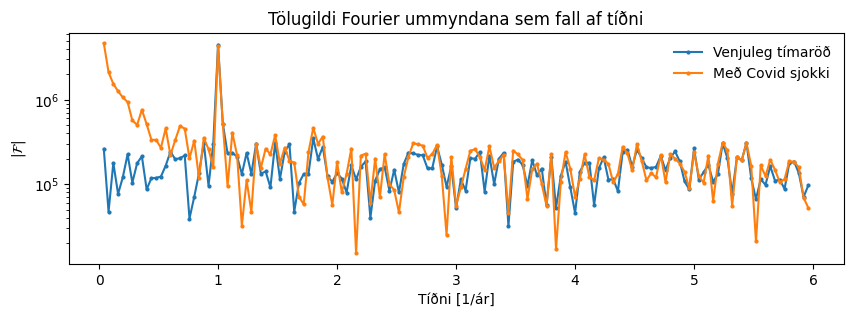

In [ ]:
# Plotting the spectrum
plt.figure(figsize=(10, 3))
plt.semilogy(steps_per_year*freqs, magnitudes, marker='.', ms=4, label='Venjuleg tímaröð')
plt.semilogy(steps_per_year*freqs, magnitudes_wc, marker='.', ms=4, label='Með Covid sjokki')
plt.title('Tölugildi Fourier ummyndana sem fall af tíðni')
plt.xlabel('Tíðni [1/ár]')
plt.ylabel('$|\mathcal{F}|$')
leg = plt.legend()
leg.get_frame().set_edgecolor('b')
leg.get_frame().set_linewidth(0.0)
plt.show()

### Spurning 1
Af hverju er vex tölugildi Fourier ummyndarinnar þegar hrapi í fjölda farþega vegna Covid er bætt inn í tímaröðina?

## Áhrif leitni og fleiri sveiflur


Búum til tímaröð sem er einkennist af áberandi leitni og tveimur sínusbylgjum með mismunandi tíðni. Þetta gæti táknað magn koltvísýrings í andrúmslofti jarðarninnar sem fall af tíma.



Length of time step: 0.030 year


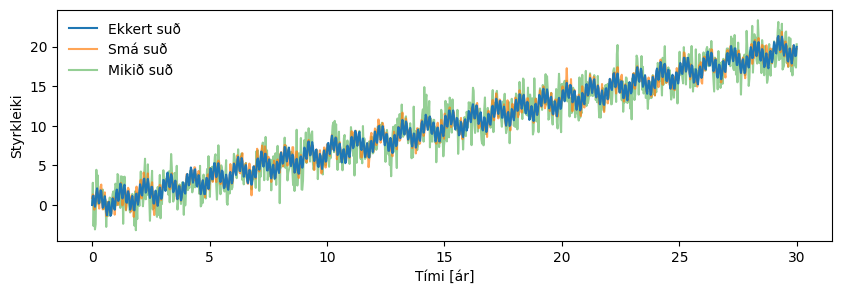

In [ ]:
np.random.seed(3)

nsteps = 1000
nyear = 30
x = np.linspace(0, nyear, nsteps)
dt = nyear/nsteps
print('Length of time step: {:.3f} year'.format(dt))

# Árstíðabundin sveifla
a1 = 1.0
f1 = 1.0

# Hraðari sveifla
a2 = 1.0
f2 = 6.0

# Styrkur suðss
n1 = 0.5
n2 = 2.5

y0 = 0.02 * np.arange(nsteps) + a1*np.sin(2*np.pi*f1*x) + a2*np.sin(2*np.pi*f2*x)
y1 = 0.02 * np.arange(nsteps) + a1*np.sin(2*np.pi*f1*x) + a2*np.sin(2*np.pi*f2*x) + 0.5*np.random.randn(nsteps)
y2 = 0.02 * np.arange(nsteps) + a1*np.sin(2*np.pi*f1*x) + a2*np.sin(2*np.pi*f2*x) + 1.5*np.random.randn(nsteps)
plt.figure(figsize=(10, 3))
plt.xlabel('Tími [ár]')
plt.ylabel('Styrkleiki')
plt.plot(x, y0, color='tab:blue', zorder=3, label='Ekkert suð')
plt.plot(x, y1, color='tab:orange', alpha=0.7, zorder=2, label='Smá suð')
plt.plot(x, y2, color='tab:green', alpha=0.5, zorder=1, label='Mikið suð')
leg = plt.legend()
leg.get_frame().set_edgecolor('b')
leg.get_frame().set_linewidth(0.0)

plt.show()

In [ ]:
period1, freqs1, magnitudes1 = fft_analysis(y0)
period2, freqs2, magnitudes2 = fft_analysis(y1)
period3, freqs3, magnitudes3 = fft_analysis(y2)


Dominant Frequency: 0.030
Dominant Period: 33.33 time units
Dominant Frequency: 0.030
Dominant Period: 33.33 time units
Dominant Frequency: 0.030
Dominant Period: 33.33 time units


<>:9: SyntaxWarning: invalid escape sequence '\m'
<>:9: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipython-input-3411820731.py:9: SyntaxWarning: invalid escape sequence '\m'
  plt.ylabel('$|\mathcal{F}|$')


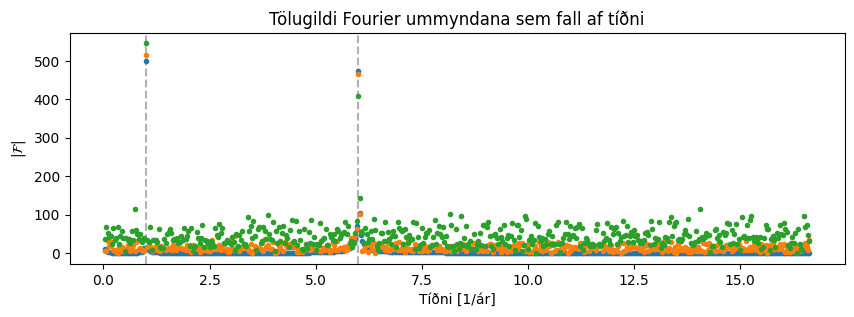

In [ ]:
plt.figure(figsize=(10, 3))
plt.plot(freqs1/dt, magnitudes1, ls='', marker='.')
plt.plot(freqs2/dt, magnitudes2, ls='', marker='.')
plt.plot(freqs3/dt, magnitudes3, ls='', marker='.')
plt.axvline(x=f1, color='black', ls='--', alpha=0.3, zorder=-1)
plt.axvline(x=f2, color='black', ls='--', alpha=0.3, zorder=-1)
plt.title('Tölugildi Fourier ummyndana sem fall af tíðni')
plt.xlabel('Tíðni [1/ár]')
plt.ylabel('$|\mathcal{F}|$')
plt.show()

# Földun og Fourier

# Földun


## Földun og hlaupandi meðaltal
Földun er kynnt til sögunnar í Kafla 8 í Boas. Þessi aðgerð er mikilvæg í hvers konar tímaraðagreiningu. Í síðustu viku kynntum við meðal annars hlaupandi meðaltal til sögunnar og notuðum það til þess að draga úr sveiflum í tímaröð.

Þessi aðgerð, þ.e.a.s. hlaupandi meðaltal, er dæmi um földunaraðgerð. Í þessu hlaupandi meðaltali skilgreindum við földunarkjarna (e. kernel) með lengd 5 (sbr. breytan `window_size=5`) og notuðum hann til þess að falda yfir tímaröð sem táknaði sínusbylgju. Til þess að varðveita stærð upprunalegu tímaraðarinnar létum við hvert stak í þessum földunarkjarna hafa stærðina `1/window_size`. Af hverju?


## Verkefni 1

Skrifið stutt fall sem notar `Numpy` til þess að falda saman tvo vigra.

Látið tímaröðina vera vigur með lengd 5 og földunarkjarnann vera vigur með lengd 3. Dæmi um földunarkjarna:

*   `k1 = np.array([0.33, 0.34, 0.33])`
*   `k2 = np.array([-1., 0., 1.])`

## Áhrif földunar á veldisvísishrörnun
Grannskoðið kóðann hér fyrir neðan.

Kjarninn sem við notum í dæminu getur t.d. lýst tregðu í mælibúnaði eða viðbrögðum

The length of the signal timestream is: 30
The length of the convolution kernel is: 5
The length of the x variable is: 30
The length of the output is: 30
The length of the xfull variable is: 34
[0.         0.17241379 0.34482759 0.51724138 0.68965517 0.86206897
 1.03448276 1.20689655 1.37931034 1.55172414 1.72413793 1.89655172
 2.06896552 2.24137931 2.4137931  2.5862069  2.75862069 2.93103448
 3.10344828 3.27586207 3.44827586 3.62068966 3.79310345 3.96551724
 4.13793103 4.31034483 4.48275862 4.65517241 4.82758621 5.
 5.17241379 5.34482759 5.51724138 5.68965517]


<>:25: SyntaxWarning: invalid escape sequence '\e'
<>:25: SyntaxWarning: invalid escape sequence '\e'
/tmp/ipython-input-1808354050.py:25: SyntaxWarning: invalid escape sequence '\e'
  plt.setp(stemlines, 'color', 'tab:blue', label='Tímaröð: $f(x) = \exp(-x)$')


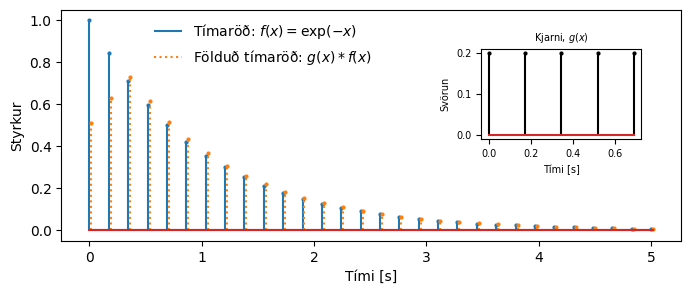

In [ ]:
plt.close('all')

# Skilgreining á tímaröð og földunarkjarna
nsamples = 30
nkernel = 5
x = np.linspace(0, 5, nsamples)
signal = np.exp(-x)
kernel  = np.ones(nkernel)
kernel = kernel / np.sum(kernel)
convolution_mode='same'
output = np.convolve(signal, kernel, mode=convolution_mode)
xfull = np.hstack([x, x[-1]+np.diff(x)[0]*np.arange(1,5)])

print('The length of the signal timestream is: {}'.format(len(signal)))
print('The length of the convolution kernel is: {}'.format(len(kernel)))
print('The length of the x variable is: {}'.format(len(x)))
print('The length of the output is: {}'.format(len(output)))
print('The length of the xfull variable is: {}'.format(len(xfull)))
print(xfull)

# Teiknum upp földun
fig, ax = plt.subplots(1, figsize=(8,3))

markerline, stemlines, baseline = plt.stem(x, signal)
plt.setp(stemlines, 'color', 'tab:blue', label='Tímaröð: $f(x) = \exp(-x)$')
plt.setp(stemlines, 'linestyle', '-')
plt.setp(markerline, 'ms', 2, 'color', 'tab:blue')

if convolution_mode=='same':
  x2use = np.copy(x)
elif convolution_mode=='full':
  x2use = np.copy(xfull)

# Hliðrum földuðu tímalínunni örlítið með 0.1*np.diff(x2use)[0]
markerline, stemlines, baseline = plt.stem(0.1*np.diff(x2use)[0] + x2use, output)
plt.setp(stemlines, 'color', 'tab:orange', label='Földuð tímaröð: $g(x) * f(x)$')
plt.setp(stemlines, 'linestyle', ':')
plt.setp(markerline, 'ms', 2, 'color', 'tab:orange')

plt.xlabel('Tími [s]')
plt.ylabel('Styrkur')
leg = plt.legend(bbox_to_anchor = [0.13, 0.7])
leg.get_frame().set_edgecolor('b')
leg.get_frame().set_linewidth(0.0)

ax2 = fig.add_axes([0.65, 0.45, 0.2, 0.3])
markerline, stemlines, baseline = ax2.stem(x[:len(kernel)], kernel)

plt.setp(stemlines, 'color', 'black', label='Kernel: $g(x)$')
plt.setp(markerline, 'ms', 2, 'color', 'black')
fs = 7
ax2.set_xlabel('Tími [s]', size=fs)
ax2.set_ylabel('Svörun', size=fs)
ax2.set_title('Kjarni, $g(x)$', size=fs)
ax2.tick_params(axis='both', which='major', labelsize=fs)

plt.show()

## Földunarkjarni á hreyfingu

Það getur verið gagnlegt að horfa á nokkrar hreyfimyndir sem til að fá aðeins betri tilfinningu fyrir földun.

Kóðinn hér fyrir neðan er byggður efni sem má finna hér:
https://github.com/Tristhal/1D-Convolution-Demo-Python

In [ ]:
import matplotlib.animation as animation
import time

from IPython import display
from ipywidgets import Image

plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150
plt.ioff()

# Define functions. Modify and/or add new functions as you wish.
def box(x):
    T = 0.5
    return (x>-T) * (x<T) * 1.0

def step(x):
    return (x > 0) * 1.0

def biphasic_unitary_step(x):
    return box(x-0.5)-box(x-1.5)

def exponential_decay(x):
    y = np.zeros_like(x)
    y[x>0] = np.exp(-x[x>0])
    return y

def triangle(x):
    # Triangle with width 1
    y = ((x+1) * step(+1) -  2*x*step(x))*box(1/2*x)
    return y

def positive_exponential_decay(x):
    ''' Exponential function which is 0 for x<0'''
    return np.exp(-x) * step(x)

def sinusoid_1_period(x):
    period = np.pi  # set the period of the sin. could make smaller or larger
    box_stretch = np.pi  #1 period wide
    box_shift = box_stretch/2  # The box should be shifted so it starts at 0 instead of -0.5

    y = np.sin(x*(2*np.pi)/period) * box(1/box_stretch*(x-box_shift))
    return y

# This is a template to write your own function. You can write multiple and use them
#  for f(x) and g(x) in the next section for the convolution
# Replace the x**2 * box(1/2*x) with whatever you want

def your_function(x):
    # quadratic * stretched box
    y_value = x**2 * box(1/2*x)
    return y_value


In [ ]:
# Selecting your functions to convolve
f = positive_exponential_decay  # Change f & g to whatever functions you want to convolve
f = sinusoid_1_period  # Change f & g to whatever functions you want to convolve
g = box  # You can use your own function defined above
g = triangle  # Change f & g to whatever functions you want to convolve

# Parameters for t axis
t_min = -4   # lower limit of x axis
t_max = 4    # higher limit of x axis
y_min = -2.0    # Lower limit of y axis
y_max = 2  # higher limit of y axis

# Animation settings
steps = 201
#steps = 2001  # The number of steps in the animation. The x axis is discretized into this number of points.
# If "steps" is set to small, a coarse resoution on x axis means you may miss the point pause_at_t and the pause occurs at its nearest neighbor.
delay_between_frames = 15  # Specifies how many ms between each frame (lower=faster)
frames_skipped = 8  # Number of frames to skip. Improves performance. Higher = faster.

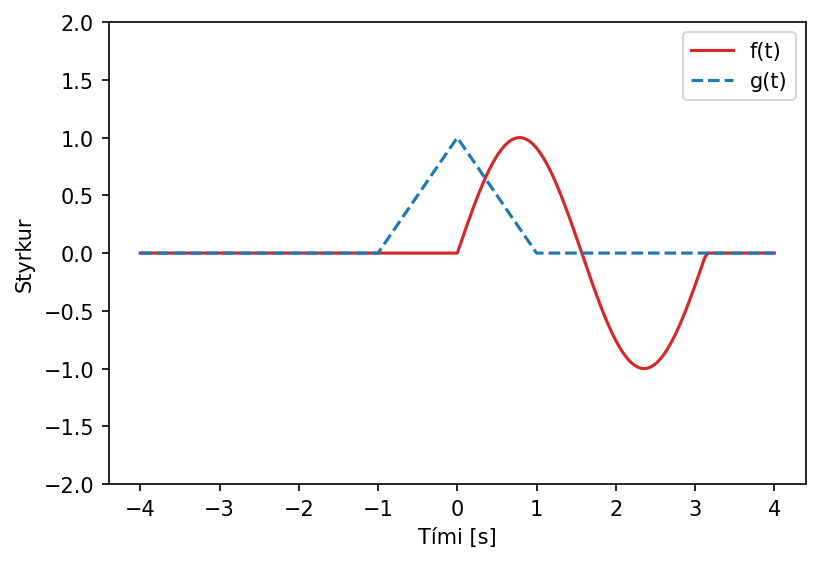

In [ ]:
## Beyond this point you only need to run the sections without changing any parameters
#%% 3 - Plotting the functions selected
x = np.linspace(t_min, t_max, steps)
t = np.linspace(t_min, t_max, steps)

# Plotting f(x) and g(x)
plt.figure(figsize=(6,4))  # Make a figure
plt.plot(x, f(x), 'tab:red', label='f(t)')  # x=x values, f(x)=y values, label adds a label for the legend
plt.plot(x, g(x), color='tab:blue', ls='--', label='g(t)')  # x=x values, g(x)=y values, label adds a label for the legend
plt.ylim(y_min, y_max)
plt.xlabel("Tími [s]")
plt.ylabel("Styrkur")
plt.legend()  # shows the legend
plt.show()  # displays the plot in the plotting menu to the right, or it pops out


In [ ]:
f_conv_g = np.convolve(f(x), g(x), mode='same') * (x[1]-x[0])

fig, ax = plt.subplots()
f_line, = ax.plot(t, f(t), 'tab:red', label='Tímaröð, f(t)')
g_line, = ax.plot(-t, g(t)*0, 'tab:blue', label='Kjarni, g(t)')
line, = ax.plot(0, 0, 'k', label='f(t)*g(t)')
area_line, = ax.fill(-t, 0*g(t)*f(t)*0, 'tab:purple', alpha=0.7, label='Flatarmál f(t)g(t)')

# Adding static components
ax.set_ylim(y_min, y_max)
ax.set_xlim(np.min(x), np.max(x))
ax.set_ylabel('Styrkur')
ax.set_xlabel('Tími [s]')
ax.legend(loc='upper left')

# Set up the indices to be plotted if it is not there
frame_range = np.arange(0, steps, frames_skipped)

# Function which updates the plot
def animate(i, t, ax, pause_frames=None):
    xy = np.array([t, (g(-(t-t[i]))*f(t))])
    xy = np.concatenate([xy, xy[:, -1][...,np.newaxis]], axis=-1)
    xy = xy.transpose()
    area_line.set_xy(xy)
    g_line.set_data(t, g(-(t-t[i])))
    line.set_data(x[:(i+1)], f_conv_g[:(i+1)])
    display.clear_output(wait=True)
    plt.show()

    if pause_frames is not None:
        if i in pause_frames:
            time.sleep(pause_duration)
    return line, f_line, g_line, area_line

def update(frame):

    # for each frame, update the data stored on each artist.
    x = t[:frame]
    y = z[:frame]
    # update the scatter plot:
    data = np.stack([x, y]).T
    scat.set_offsets(data)
    # update the line plot:
    line2.set_xdata(t[:frame])
    line2.set_ydata(z2[:frame])

    return (scat, line2)

animation.FuncAnimation(fig, lambda j: animate(j, t, ax),
                        frames=steps, interval=50)


Kafli 8.10 í Boas fjallar um Földun í tengslum við Laplace-ummyndanir. Földun fallanna $f(t)$ og $g(t)$ er skilgreind sem:
$$
f(t) * g(t) = \int _{-\infty}^\infty f(\tau) g(t-\tau) d\tau
$$

Það mætti segja að földun fallanna $f$ og $g$ segi til um fylgni þeirra þegar annað fallið er dregið (eða faldað) eftir hinu fallinu. Hér er kannski gott að kíkja á hreyfimyndirnar sem við gerðum í síðustu viku

Ummfjöllun um faldanir í Kafla 8.10 kynna til afar mikilvæga niðurstöðu fyrir tímaraðagreiningu: **Földun falla eftir raunás (e. real space) jafngildir margfeldi Fourier-ummyndana fallanna**

Látum $\mathcal{F}$ tákna Fourier-ummyndunar virkjann. Þessi niðurstaða segir að:
$$
\mathcal{F} (f(t) * g(t)) = \mathcal{F} (f(t)) \cdot \mathcal{F} (g(t)).
$$

Í kóðanum hér fyrir neðan látum við reyna á þessa niðurstöðu með Python kóða:

In [ ]:
Fs = 1000.  # Mælitíðni tímaraðar mæld í Hz
T = 1  # Hálf lengd tímaraðar mæld í s
t = np.arange(-T, T, 1/Fs)  # Tímavigur
y1 = np.sin(2 * np.pi * 5 * t) # Fall 1
y2 = np.exp(-t ** 2) # Fall 2

# Földun fallanna eftir tímaás
convolution_time = np.convolve(y1, y2, mode='full')

# Bætum núllum við gildi fallanna til þess að losna við skringilega hegðun í jöðrum tímaraðar
y1_pad = np.pad(y1, (0, t.size-1), 'constant')
y2_pad = np.pad(y2, (0, t.size-1), 'constant')

# Reiknum strjála Fourier-ummyndun fallanna
Y1 = np.fft.fft(y1_pad)
Y2 = np.fft.fft(y2_pad)

# Margföldum Fourier-raðir fallnna á tíðniás (e. frequency domain) og reiknum andhverfa Fourier-ummyndin
convolution_freq_domain = np.fft.ifft(Y1 * Y2)

In [ ]:
def plot_convolution(t, y1, y2, convolution_time, convolution_freq_domain):
    fig, axs = plt.subplots(1, 3, figsize=(14, 3))

    # Upprunaleg föll
    axs[0].plot(t, y1, label='Merki 1')
    axs[0].plot(t, y2, label='Merki 2')
    axs[0].legend()

    # Földun fallanna eftir tímaás
    axs[1].plot(convolution_time)
    axs[1].set_title('Földun eftir tímaás')

    # Margfeldi Fourier-ummynduðu fallanna og svo andhverf Fourier-ummyndun
    axs[2].plot(convolution_freq_domain)
    axs[2].set_title('Margfeldi á tíðniás')

    plt.tight_layout()
    plt.show()

/usr/local/lib/python3.12/dist-packages/matplotlib/cbook.py:1709: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/usr/local/lib/python3.12/dist-packages/matplotlib/cbook.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


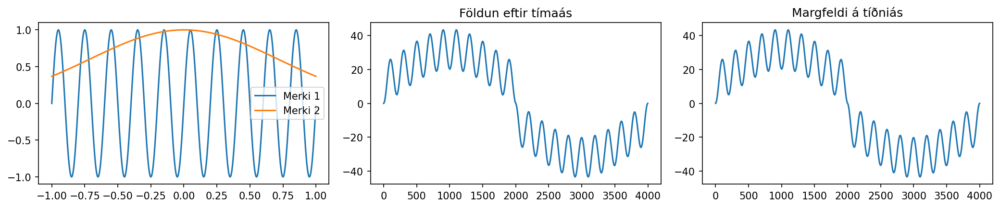

In [ ]:
plot_convolution(t, y1, y2, convolution_time, convolution_freq_domain)